# Importing the libraries and loading the data set


In [354]:
#Importing Libraries required and tweaking warnings for cleaner jupyter ouputs
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import numpy as np

from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.impute import SimpleImputer

from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from yellowbrick.cluster import SilhouetteVisualizer

sns.set(style="whitegrid")
warnings.filterwarnings('ignore')


In [355]:
#Loading the data from the file
data = pd.read_csv('mh.csv')

# Familiarizing with the data

In [270]:
# Visualise the raw data
data
#print(data)

,is_self_employed,number_of_employees,is_tech_company,is_role_tech_related,provides_mental_health_benefits,aware_of_mental_health_options,employer_discusses_mental_health,employer_resources_for_mental_health,anonymity_protected_for_treatment,request_medical_leave_due_to_mental_health,...,treatment_interference_with_work_when_effectively_treated,treatment_interference_with_work_when_not_effectively_treated,age,gender,country_of_residence,us_state_or_territory_of_residence,country_of_work,us_state_or_territory_of_work,work_position,works_remotely
0,0,26-100,1.0,NaN,Not eligible for coverage / N/A,NaN,No,No,I don't know,Very easy,...,Not applicable to me,Not applicable to me,39,Male,United Kingdom,NaN,United Kingdom,NaN,Back-end Developer,Sometimes
1,0,6-25,1.0,NaN,No,Yes,Yes,Yes,Yes,Somewhat easy,...,Rarely,Sometimes,29,male,United States of America,Illinois,United States of America,Illinois,Back-end Developer|Front-end Developer,Never
2,0,6-25,1.0,NaN,No,NaN,No,No,I don't know,Neither easy nor difficult,...,Not applicable to me,Not applicable to me,38,Male,United Kingdom,NaN,United Kingdom,NaN,Back-end Developer,Always
3,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Sometimes,Sometimes,43,male,United Kingdom,NaN,United Kingdom,NaN,Supervisor/Team Lead,Sometimes
4,0,6-25,0.0,1.0,Yes,Yes,No,No,No,Neither easy nor difficult,...,Sometimes,Sometimes,43,Female,United States of America,Illinois,United States of America,Illinois,Executive Leadership|Supervisor/Team Lead|Dev ...,Sometimes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1428,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Not applicable to me,Not applicable to me,34,Female,United States of America,New York,United States of America,New York,Other,Sometimes
1429,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Sometimes,Often,56,MALE,United States of America,California,Afghanistan,NaN,Support,Sometimes
1430,0,100-500,1.0,NaN,Yes,Yes,Yes,Yes,I don't know,Somewhat difficult,...,Rarely,Sometimes,52,Male,United States of America,Georgia,United States of America,Georgia,Back-end Developer,Sometimes
1431,0,100-500,0.0,1.0,I don't know,I am not sure,No,Yes,I don't know,Somewhat difficult,...,Sometimes,Often,30,Female,United States of America,Nebraska,United States of America,Nebraska,DevOps/SysAdmin,Sometimes


In [271]:
# Visualise the number of rows and columns 
print(data.shape)

(1433, 63)


In [272]:
# Visualise a summary of data using describe
data.describe()
#print(data.describe())

,is_self_employed,is_tech_company,is_role_tech_related,has_medical_coverage_for_mental_health,has_previous_employers,sought_treatment_for_mental_health,age
count,1433.000000,1146.000000,263.000000,287.000000,1433.000000,1433.000000,1433.000000
mean,0.200279,0.770506,0.942966,0.644599,0.882066,0.585485,34.286113
std,0.400349,0.420691,0.232350,0.479471,0.322643,0.492810,11.290931
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
25%,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,28.000000
50%,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,33.000000
75%,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,39.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,323.000000


In [273]:
# Visualise a summary of data using describe only for columns with the type 'Object'  
try:
    data.describe(include='object')
    print(data.describe(include='object'))
except:
    print("No 'object' columns")

       number_of_employees provides_mental_health_benefits  \
count                 1146                            1146   
unique                   6                               4   
top                 26-100                             Yes   
freq                   292                             531   

       aware_of_mental_health_options employer_discusses_mental_health  \
count                            1013                             1146   
unique                              3                                3   
top                                No                               No   
freq                              354                              813   

       employer_resources_for_mental_health anonymity_protected_for_treatment  \
count                                  1146                              1146   
unique                                    3                                 3   
top                                      No                      I don't kn

In [274]:
# Visualise a summary of data using describe only for columns with the type 'Boolean'  
try:
    print(data.describe(include='bool'))
except:
    print("No 'boolean' columns")

No 'boolean' columns


In [275]:
# Visualise a summary of data using describe only for columns with the type 'Integer'  
try:
    print(data.describe(include='int'))
except:
    print("No 'integer' columns")

       is_self_employed  has_previous_employers  \
count       1433.000000             1433.000000   
mean           0.200279                0.882066   
std            0.400349                0.322643   
min            0.000000                0.000000   
25%            0.000000                1.000000   
50%            0.000000                1.000000   
75%            0.000000                1.000000   
max            1.000000                1.000000   

       sought_treatment_for_mental_health          age  
count                         1433.000000  1433.000000  
mean                             0.585485    34.286113  
std                              0.492810    11.290931  
min                              0.000000     3.000000  
25%                              0.000000    28.000000  
50%                              1.000000    33.000000  
75%                              1.000000    39.000000  
max                              1.000000   323.000000  


In [276]:
# Visualise a summary of data using describe only for columns with the type 'Float'  
try:
    print(data.describe(include='float'))
except:
    print("No 'float' columns")

       is_tech_company  is_role_tech_related  \
count      1146.000000            263.000000   
mean          0.770506              0.942966   
std           0.420691              0.232350   
min           0.000000              0.000000   
25%           1.000000              1.000000   
50%           1.000000              1.000000   
75%           1.000000              1.000000   
max           1.000000              1.000000   

       has_medical_coverage_for_mental_health  
count                              287.000000  
mean                                 0.644599  
std                                  0.479471  
min                                  0.000000  
25%                                  0.000000  
50%                                  1.000000  
75%                                  1.000000  
max                                  1.000000  


In [277]:
# Visualise the top five rows
print(data.head())

   is_self_employed number_of_employees  is_tech_company  \
0                 0              26-100              1.0   
1                 0                6-25              1.0   
2                 0                6-25              1.0   
3                 1                 NaN              NaN   
4                 0                6-25              0.0   

   is_role_tech_related  provides_mental_health_benefits  \
0                   NaN  Not eligible for coverage / N/A   
1                   NaN                               No   
2                   NaN                               No   
3                   NaN                              NaN   
4                   1.0                              Yes   

  aware_of_mental_health_options employer_discusses_mental_health  \
0                            NaN                               No   
1                            Yes                              Yes   
2                            NaN                               No   
3 

In [278]:
# Visualise the Label of every column
print(list(data.columns))

['is_self_employed', 'number_of_employees', 'is_tech_company', 'is_role_tech_related', 'provides_mental_health_benefits', 'aware_of_mental_health_options', 'employer_discusses_mental_health', 'employer_resources_for_mental_health', 'anonymity_protected_for_treatment', 'request_medical_leave_due_to_mental_health', 'fear_negative_consequences_discussing_mental_health', 'fear_negative_consequences_discussing_physical_health', 'comfortable_discussing_mental_health_with_coworkers', 'comfortable_discussing_mental_health_with_supervisors', 'employer_takes_mental_health_seriously', 'observed_negative_consequences_for_open_discussions', 'has_medical_coverage_for_mental_health', 'aware_of_local_or_online_mental_health_resources', 'disclosed_mental_health_issue_to_clients', 'disclosure_impact_on_relationships_with_clients', 'disclosed_mental_health_issue_to_coworkers', 'disclosure_impact_on_relationships_with_coworkers', 'productivity_impacted_by_mental_health', 'percentage_of_work_time_impacted_

In [279]:
# Visulaise info on the values of every column
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1433 entries, 0 to 1432
Data columns (total 63 columns):
 #   Column                                                          Non-Null Count  Dtype  
---  ------                                                          --------------  -----  
 0   is_self_employed                                                1433 non-null   int64  
 1   number_of_employees                                             1146 non-null   object 
 2   is_tech_company                                                 1146 non-null   float64
 3   is_role_tech_related                                            263 non-null    float64
 4   provides_mental_health_benefits                                 1146 non-null   object 
 5   aware_of_mental_health_options                                  1013 non-null   object 
 6   employer_discusses_mental_health                                1146 non-null   object 
 7   employer_resources_for_mental_health               

In [280]:
# Visualizing Value counts of every column
for col in data.columns:
    print(data[col].value_counts())
    print("-----------------------------------")

is_self_employed
0    1146
1     287
Name: count, dtype: int64
-----------------------------------
number_of_employees
26-100            292
More than 1000    256
100-500           248
6-25              210
500-1000           80
1-5                60
Name: count, dtype: int64
-----------------------------------
is_tech_company
1.0    883
0.0    263
Name: count, dtype: int64
-----------------------------------
is_role_tech_related
1.0    248
0.0     15
Name: count, dtype: int64
-----------------------------------
provides_mental_health_benefits
Yes                                531
I don't know                       319
No                                 213
Not eligible for coverage / N/A     83
Name: count, dtype: int64
-----------------------------------
aware_of_mental_health_options
No               354
I am not sure    352
Yes              307
Name: count, dtype: int64
-----------------------------------
employer_discusses_mental_health
No              813
Yes             230
I d

In [281]:
# Visulaise the numebr off missing values in every column
print(data.isnull().sum())

is_self_employed                         0
number_of_employees                    287
is_tech_company                        287
is_role_tech_related                  1170
provides_mental_health_benefits        287
                                      ... 
us_state_or_territory_of_residence     593
country_of_work                          0
us_state_or_territory_of_work          582
work_position                            0
works_remotely                           0
Length: 63, dtype: int64


In [282]:
# Visualise the numebr of duplicated values
print(data.duplicated().sum())

0


In [283]:
# Visualise info on values of a specific column
try:
    print(data.value_counts("Column"))
except:
    print("No column found with that name")

No column found with that name


In [284]:
# Visualise info on the shared values between specific columns
try:
    print(data['column 1'].isin(data["column 2"]).value_counts())
except:
    print("The columns specified does not exist")

The columns specified does not exist


In [285]:
# Visualise info on the shared values with the same index between specific columns
try:
    print((data['column 1'] == data['column 2']))
except:
    print("The columns specified does not exist")

The columns specified does not exist


# Preproccessing the data

In [356]:
# Change columns to a better format
data.columns = [
    'is_self_employed',
    'number_of_employees',
    'is_tech_company',
    'is_role_tech_related',
    'provides_mental_health_benefits',
    'aware_of_mental_health_options',
    'employer_discusses_mental_health',
    'employer_resources_for_mental_health',
    'anonymity_protected_for_treatment',
    'request_medical_leave_due_to_mental_health',
    'fear_negative_consequences_discussing_mental_health',
    'fear_negative_consequences_discussing_physical_health',
    'comfortable_discussing_mental_health_with_coworkers',
    'comfortable_discussing_mental_health_with_supervisors',
    'employer_takes_mental_health_seriously',
    'observed_negative_consequences_for_open_discussions',
    'has_medical_coverage_for_mental_health',
    'aware_of_local_or_online_mental_health_resources',
    'disclosed_mental_health_issue_to_clients',
    'disclosure_impact_on_relationships_with_clients',
    'disclosed_mental_health_issue_to_coworkers',
    'disclosure_impact_on_relationships_with_coworkers',
    'productivity_impacted_by_mental_health',
    'percentage_of_work_time_impacted_by_mental_health',
    'has_previous_employers',
    'previous_employers_provided_mental_health_benefits',
    'aware_of_mental_health_options_with_previous_employers',
    'previous_employers_discussed_mental_health',
    'previous_employers_resources_for_mental_health',
    'anonymity_protected_for_previous_employers',
    'fear_negative_consequences_discussing_mental_health_previous',
    'fear_negative_consequences_discussing_physical_health_previous',
    'willing_to_discuss_mental_health_with_previous_coworkers',
    'willing_to_discuss_mental_health_with_previous_supervisors',
    'previous_employers_took_mental_health_seriously',
    'observed_negative_consequences_for_coworkers_previous',
    'willing_to_discuss_physical_health_in_interview',
    'reason_for_willingness_to_discuss_physical_health',
    'willing_to_discuss_mental_health_in_interview',
    'reason_for_willingness_to_discuss_mental_health',
    'fear_career_impact_from_mental_health_disclosure',
    'fear_negative_view_from_coworkers_due_to_mental_health',
    'willing_to_share_mental_health_with_friends_family',
    'observed_unsupportive_response_to_mental_health_issues',
    'impact_of_observing_others_on_disclosure_of_mental_health',
    'family_history_of_mental_illness',
    'history_of_mental_health_disorder',
    'current_mental_health_disorder',
    'diagnosed_conditions',
    'suspected_conditions',
    'diagnosed_by_professional',
    'diagnosed_conditions_by_professional',
    'sought_treatment_for_mental_health',
    'treatment_interference_with_work_when_effectively_treated',
    'treatment_interference_with_work_when_not_effectively_treated',
    'age',
    'gender',
    'country_of_residence',
    'us_state_or_territory_of_residence',
    'country_of_work',
    'us_state_or_territory_of_work',
    'work_position',
    'works_remotely'
]

In [357]:
# Calculate the value counts for the 'country_of_residence' column
value_counts = data['country_of_residence'].value_counts()
threshold = round(data.shape[0] * 0.03)
countries_to_keep = value_counts[value_counts >= threshold].index.tolist()
data['country_of_residence'] = data['country_of_residence'].apply(lambda x: x if x in countries_to_keep else "other")

In [358]:
# Categorize age using pd.cut
data['age'] = pd.cut(data['age'], bins=[18, 30, 40, 50, 60], 
                     labels=['18-30', '30-40', '40-50', '50+'], 
                     right=False).fillna('50+')

In [359]:
# Cleaning the job roles to categories
category_map = {
    "Management":["supervisor", "team lead", "leadership", "executive"],
    "Development":["back", "developer", "front", "devops", "sysadmin", "dev"],
}

def categorize_role(role):
    role = role.lower()
    for key, values in category_map.items():
        if any(value in role for value in values):
            return key
    return "Other"

data['work_position'] = data['work_position'].apply(categorize_role)

In [360]:
# Cleaning and replacing values in the DataFrame

# Define replacement mappings
replacements = {
    'number_of_employees': {
        "1-5": "1-100",
        "6-25": "1-100",
        "26-100": "1-100",
        "More than 1000": "1000+"
    },
    'treatment_interference_with_work_when_not_effectively_treated': {
        "Often": "Often",
        "Sometimes": "Sometimes",
        "Never": "Rarely",
        "Rarely": "Rarely"
    },
    'is_self_employed': {1: 'Yes', 0: 'No'},
    'is_tech_company': {1: 'Yes', 0: 'No'},
    'has_previous_employers': {1: 'Yes', 0: 'No'},
    'sought_treatment_for_mental_health': {1: 'Yes', 0: 'No'},
    'country_of_residence': {
        "United States of America": "USA", 
        "United Kingdom": "UK"
    },
    'aware_of_mental_health_options_with_previous_employers': {
        'I was aware of some': 'Yes',
        'Yes, I was aware of all of them': 'Yes',
        'N/A (not currently aware)': 'No',
        'No, I only became aware later': 'No'
    },
    'previous_employers_discussed_mental_health': {
        'Some did': 'Yes',
        'Yes, they all did': 'Yes',
        'None did': 'No',
        'I don\'t know': 'No'
    },
    'previous_employers_resources_for_mental_health': {
        'None Did': 'No',
        'Yes, they all did': 'Yes',
        'Some did': 'Yes',
    },
    'family_history_of_mental_illness': {
        'I don\'t know': 'Maybe'
    },
    'willing_to_share_mental_health_with_friends_family': {
        'Very open': 'Yes',
        'Somewhat open': 'Yes',
        'Somewhat not open': 'No',
        'Not open at all': 'No',
        'Neutral': 'Maybe',
        'Not applicable to me (I do not have a mental illness)': 'Maybe'
    },
    'observed_negative_consequences_for_open_discussions': {
        'Some of them': 'Yes',
        'Yes, all of them': 'Yes',
        'None of them': 'No'
    },
    'willing_to_discuss_mental_health_with_previous_supervisors': {
        'Yes, at all of my previous employers': 'Yes',
        'Some of my previous employers': 'Yes',
        'No, at none of my previous employers': 'No',
        'I don\'t know': 'Maybe'
    },
    'fear_negative_consequences_discussing_physical_health': {
        'Yes': 'Yes',
        'No': 'No',
        'Maybe': 'Yes'
    },
    'willing_to_discuss_mental_health_with_previous_coworkers': {
        'Yes, at all of my previous employers': 'Yes',
        'No, at none of my previous employers': 'No',
        'Some of my previous employers': 'Maybe'
    }
}

# Replace values in the DataFrame
for column, mapping in replacements.items():
    data[column] = data[column].replace(mapping)

In [361]:
#Cealning gender
data["gender"] = data["gender"].str.lower()
data["gender"] = data["gender"].str.strip()
male = ["male","m","malr","sex is male","mail" , "dude","m|",
        "i'm a man why didn't you make this a drop down question. you should of asked sex? and i would of answered yes please. seriously how much text can this take?",
        "male.", "man"]

female = ["f","woman", "female", "fm", " female", "female/woman",
         "female (props for making this a freeform field, though)",
         "fem", "female ", "i identify as female."]

data["gender"] = data["gender"].replace(male, "man")
data["gender"] = data["gender"].replace(female, "woman")

data["gender"] = data["gender"].apply(lambda x: "diverse" if x not in ["man", "woman"] else x)

In [362]:
# Droping columns due to duplicate and defined in other columns or not enough  
columns_to_drop = ["country_of_work","is_tech_company"]
data.drop(columns_to_drop, axis=1, inplace=True)

In [363]:
# Remove uncertain answers and columns that are missing more than 30%, 29%, 24%, 22%, 21% or 20% of the values
data = data.replace("I don't know",np.nan)

percentage_missing = data.isnull().sum() * 100 / len(data)
col_to_drop = percentage_missing[percentage_missing > 20].keys()
data.drop(col_to_drop, axis=1, inplace=True)

In [364]:
# dealing with the null values and replacing them with the most frequent values.
data = data.replace("Not applicable to me",np.nan)

mode_imputer = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
mode_imputer.fit(data)
imputed_data = mode_imputer.transform(data)
data = pd.DataFrame(data=imputed_data, columns=data.columns)


In [365]:
# Cleaning for yes no maybe 'coworker_mh_view' 'career_mh_impact']
def simplify_view_and_impact(value):
    value = value.lower()  # Convert to lowercase for case-insensitivity
    if "yes" in value:
        return "Yes"
    elif "no" in value:
        return "No"
    else:
        return "Maybe"

# Applying the function with the updated names
data['fear_negative_view_from_coworkers_due_to_mental_health'] = data['fear_negative_view_from_coworkers_due_to_mental_health'].apply(simplify_view_and_impact)
data['fear_career_impact_from_mental_health_disclosure'] = data['fear_career_impact_from_mental_health_disclosure'].apply(simplify_view_and_impact)
data['observed_unsupportive_response_to_mental_health_issues'] = data['observed_unsupportive_response_to_mental_health_issues'].apply(simplify_view_and_impact)


In [366]:
# Save as new file
data.to_csv('filename.csv', index=False)

# Bar-Chart for every Column

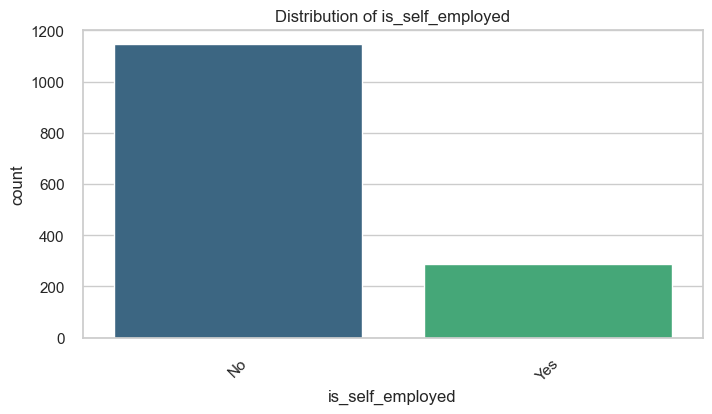

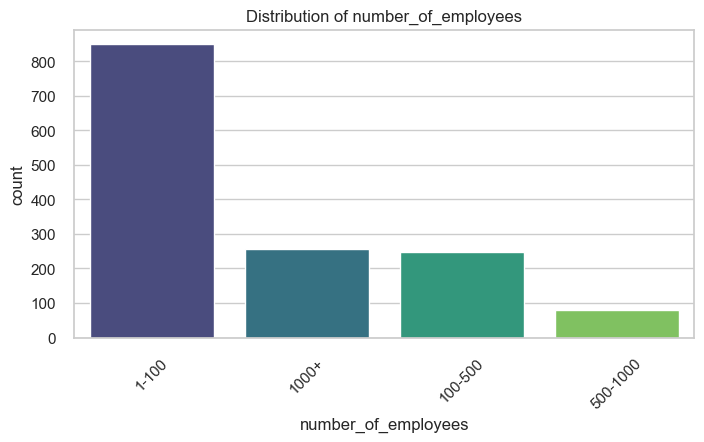

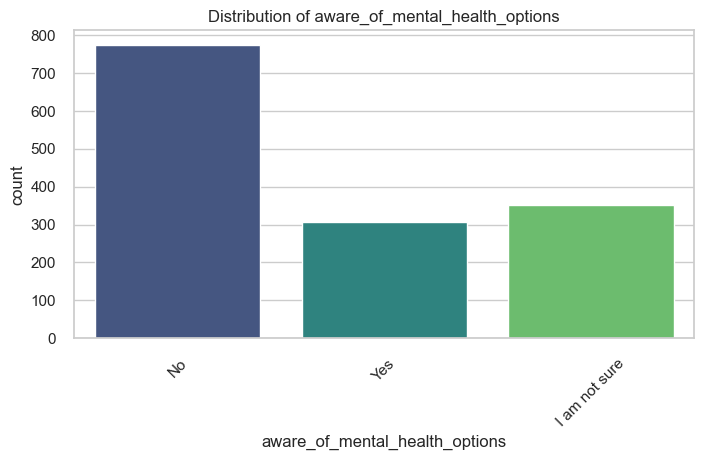

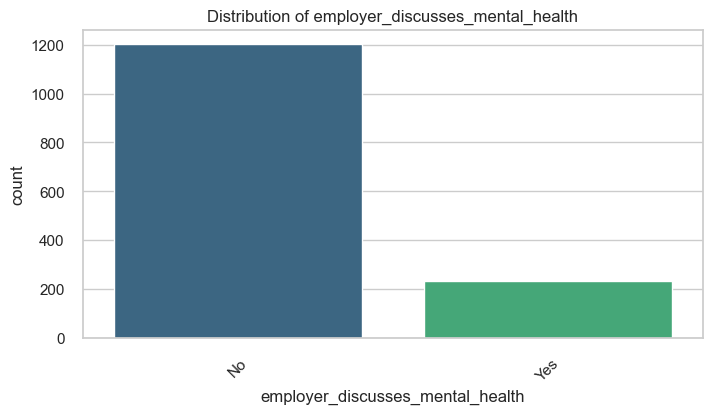

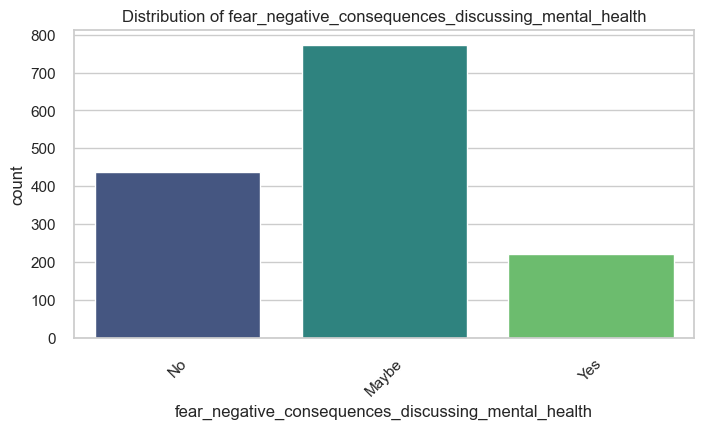

...

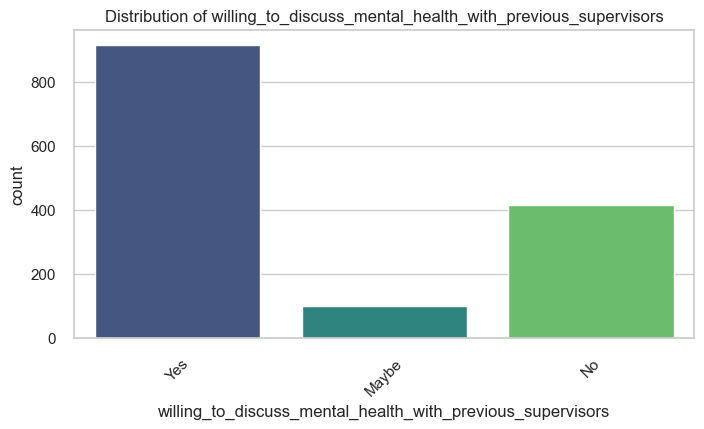

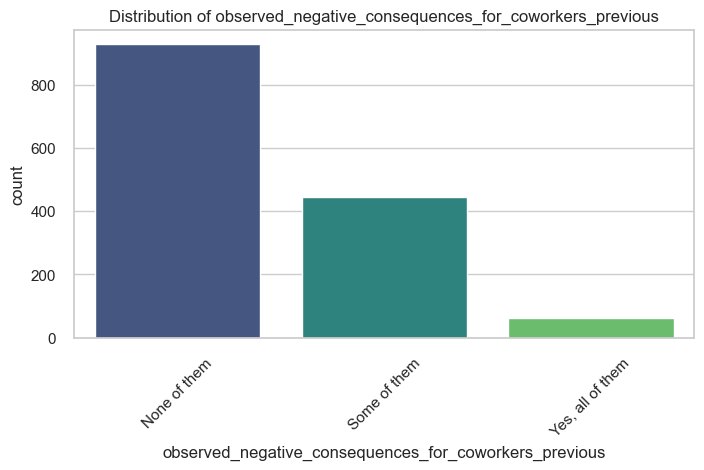

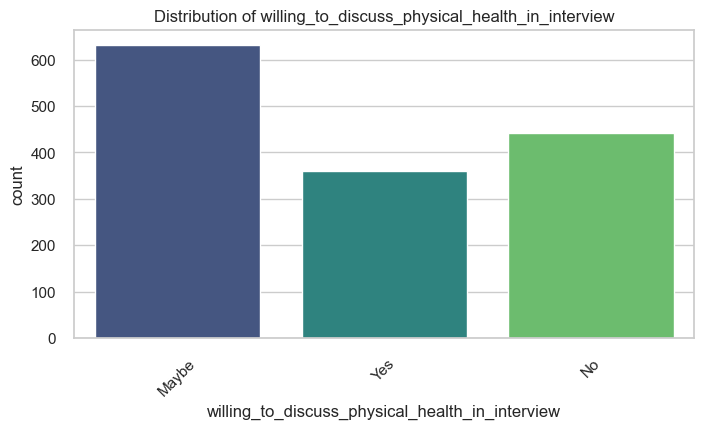

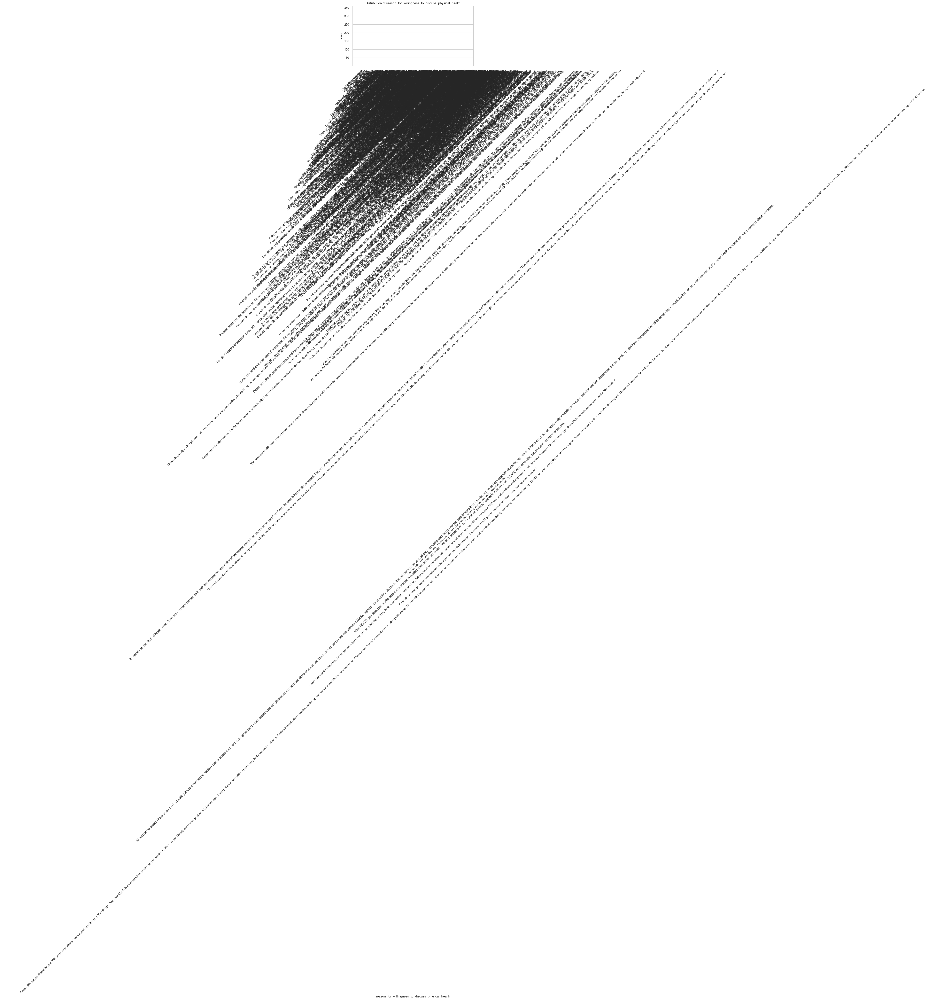

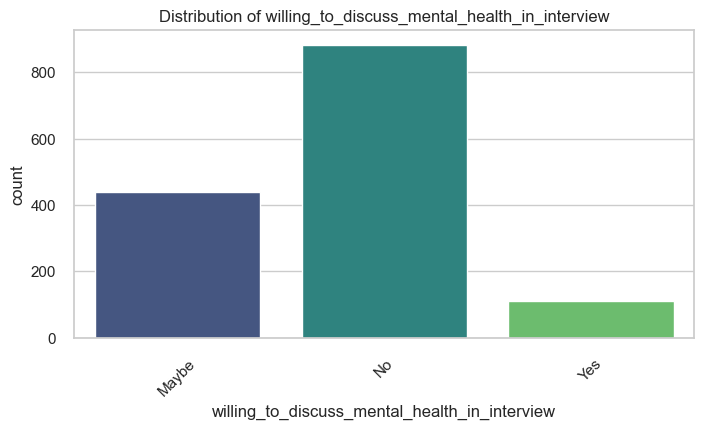

KeyboardInterrupt: 

In [319]:
# Bar charts for categorical columns
for col in data.columns:
    plt.figure(figsize=(8, 4))
    sns.countplot(data=data, x=col, palette="viridis")
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=45)
    plt.show()

# Pie-Chart for every Column

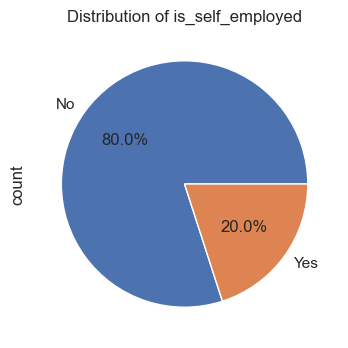

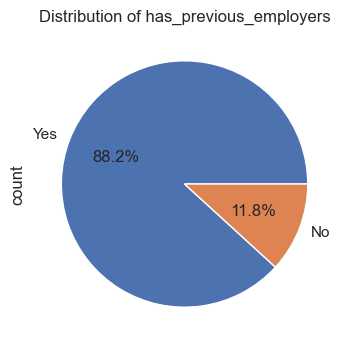

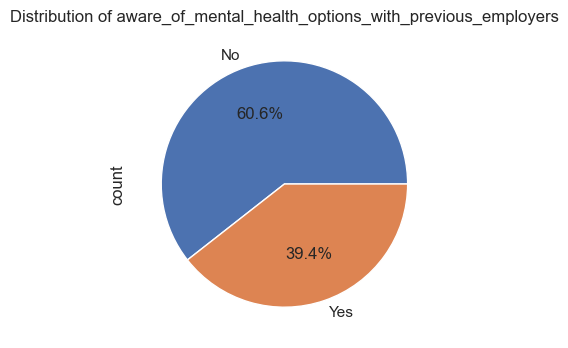

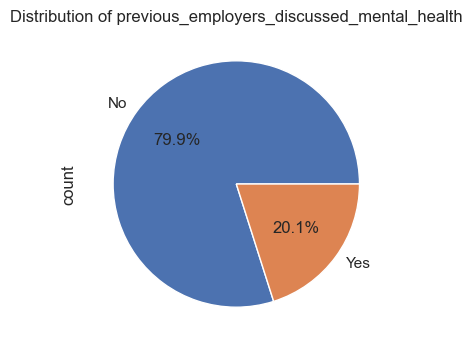

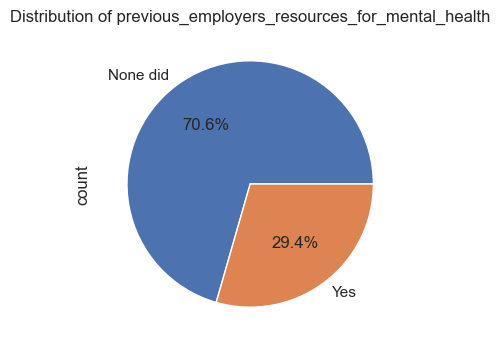

...

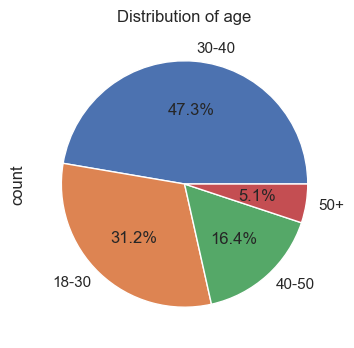

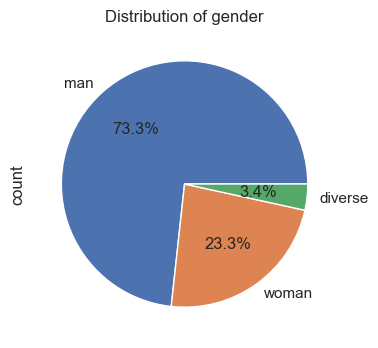

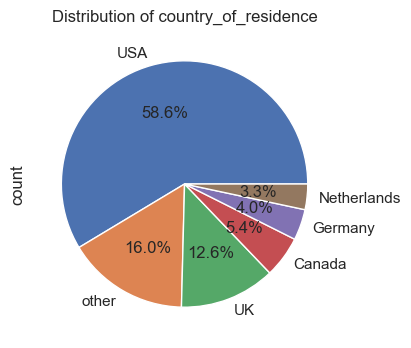

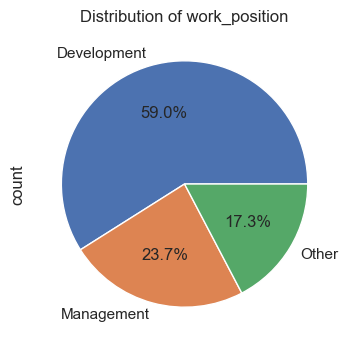

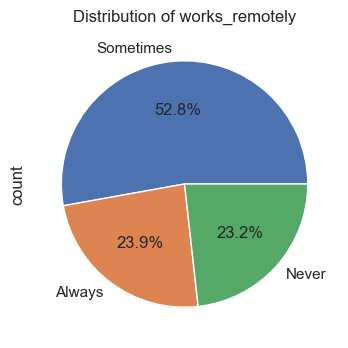

In [367]:
# Pie charts for categorical columns
for col in data.columns:
    plt.figure(figsize=(8, 4))
    data[col].value_counts().plot(kind='pie', autopct='%1.1f%%')
    plt.title(f'Distribution of {col}')
    plt.show()

# Pair Plot for every Column

In [ ]:
# For all
for col1 in data.columns:
    for col2 in data.columns:
        if col1 != col2:
            plt.figure(figsize=(8, 4))
            ct = pd.crosstab(data[col1], data[col2])
            ct.plot(kind='bar', stacked=True)
            plt.title(f'Relationship between {col1} and {col2}')
            plt.show()

# Graphs and Plots

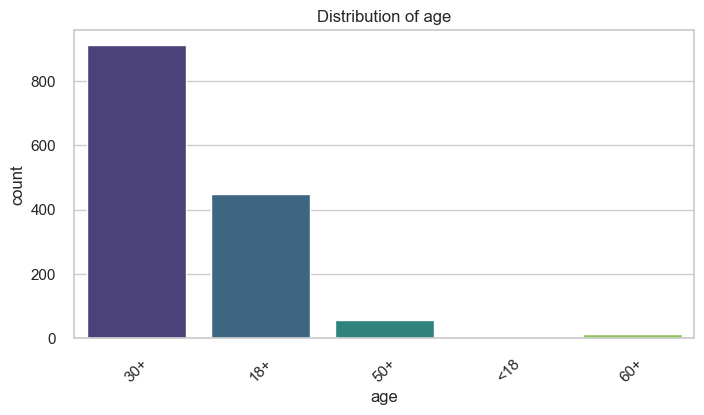

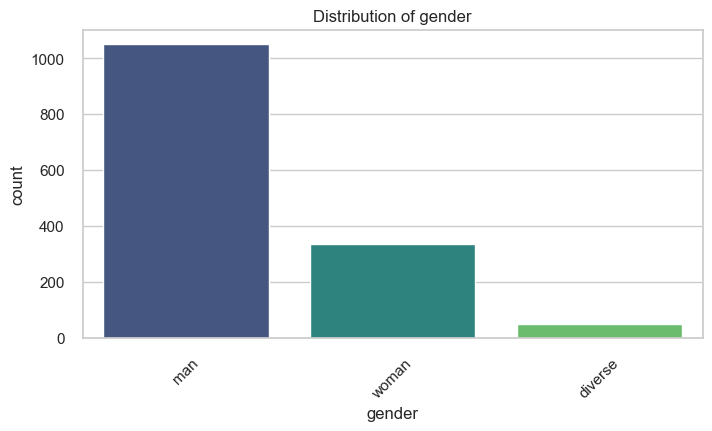

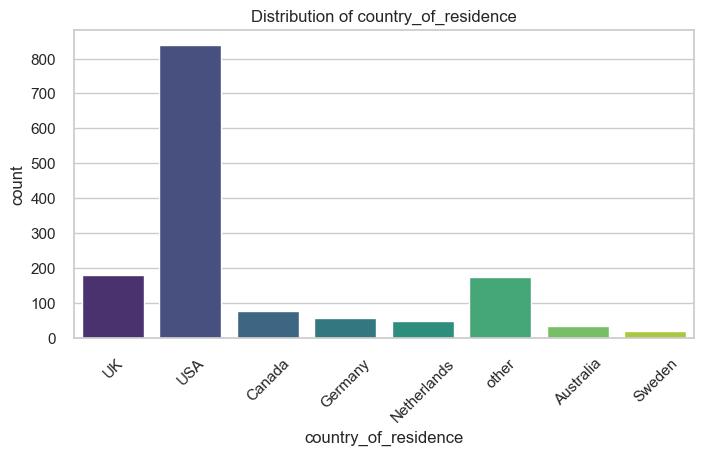

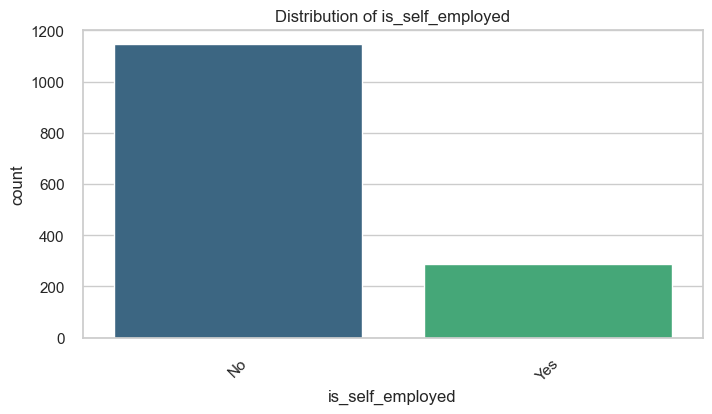

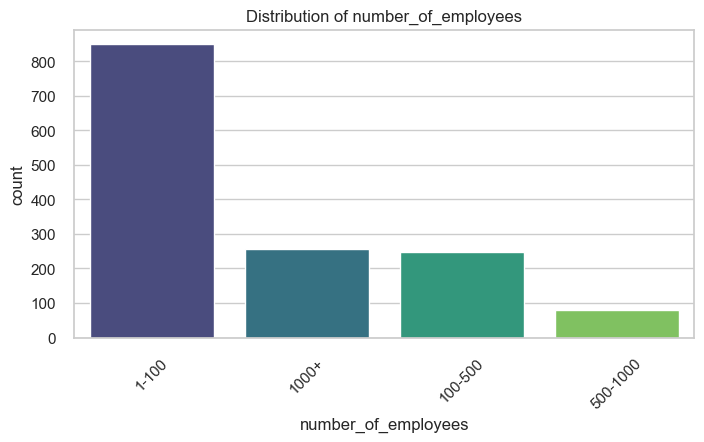

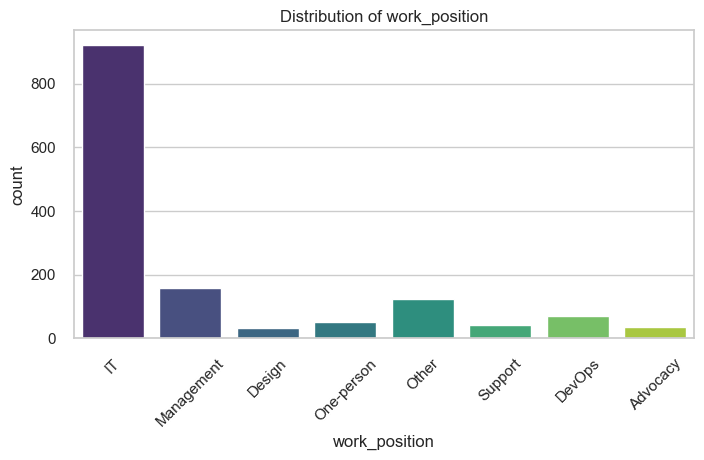

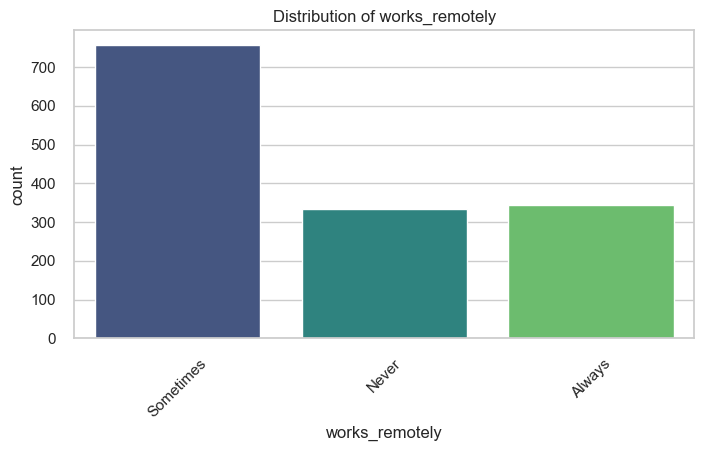

In [15]:
# 1. Bar Charts for selected columns
Columns = [
    'age',
    'gender',
    'country_of_residence', 
    'is_self_employed',      
    'number_of_employees',     
    'work_position', 
    'works_remotely',
    ]

for col in Columns:
    plt.figure(figsize=(8, 4))
    sns.countplot(data=data, x=col, palette="viridis")
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=45)
    plt.show()

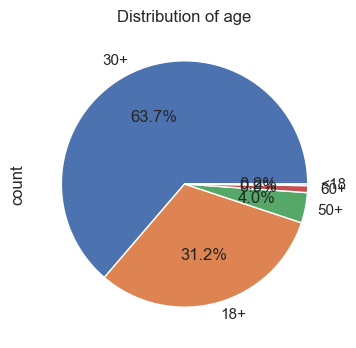

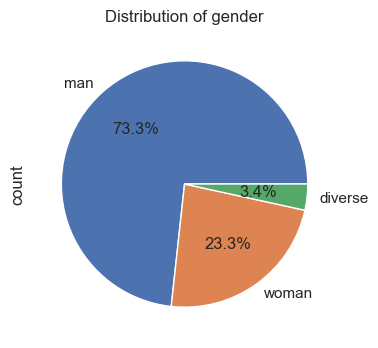

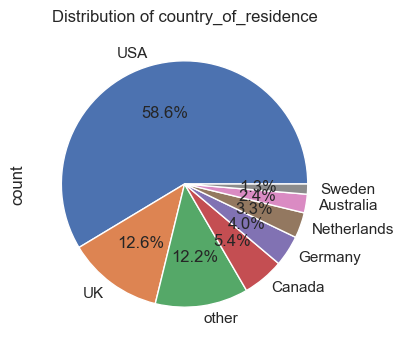

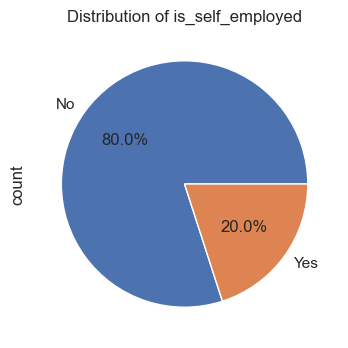

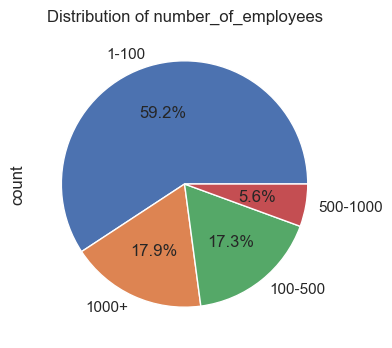

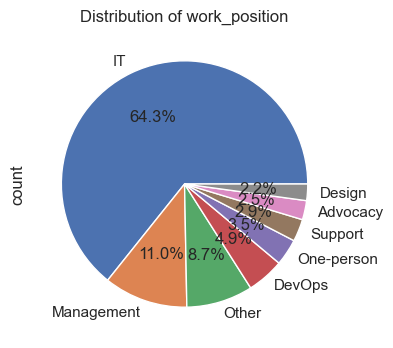

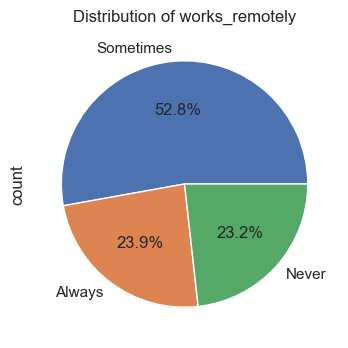

In [16]:
# 2. Pie Charts for selected Columns
Columns = [
    'age',
    'gender',
    'country_of_residence', 
    'is_self_employed',      
    'number_of_employees',     
    'work_position', 
    'works_remotely',
    ]

for col in Columns:
    plt.figure(figsize=(8, 4))
    data[col].value_counts().plot(kind='pie', autopct='%1.1f%%')
    plt.title(f'Distribution of {col}')
    plt.show()

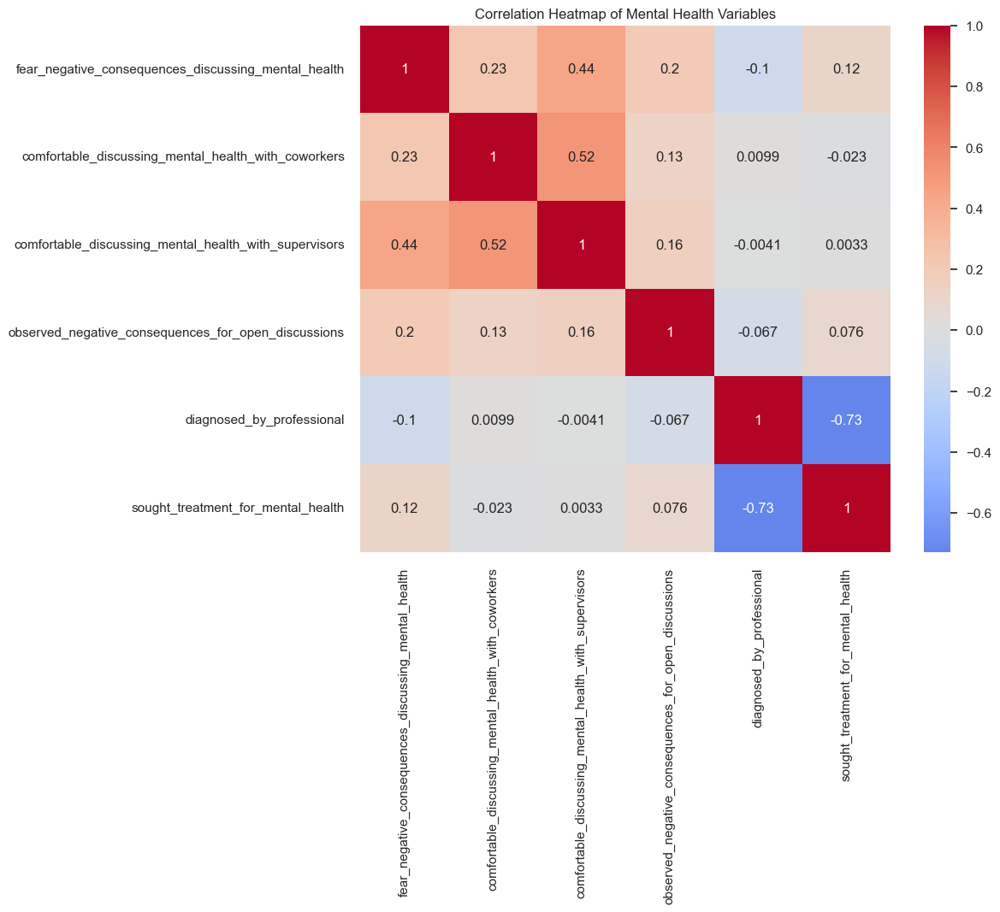

In [17]:
# 3. Heatmap of Correlations (for Mental Health-Related Variables)
mh_vars = [
    'fear_negative_consequences_discussing_mental_health', 
    'comfortable_discussing_mental_health_with_coworkers', 
    'comfortable_discussing_mental_health_with_supervisors', 
    'observed_negative_consequences_for_open_discussions', 
    'diagnosed_by_professional', 
    'sought_treatment_for_mental_health'
]

# Convert categorical variables to numeric for correlation
mh_data = data[mh_vars].apply(lambda x: pd.factorize(x)[0])

plt.figure(figsize=(10, 8))
sns.heatmap(mh_data.corr(), annot=True, cmap="coolwarm", center=0)
plt.title('Correlation Heatmap of Mental Health Variables')
plt.show()

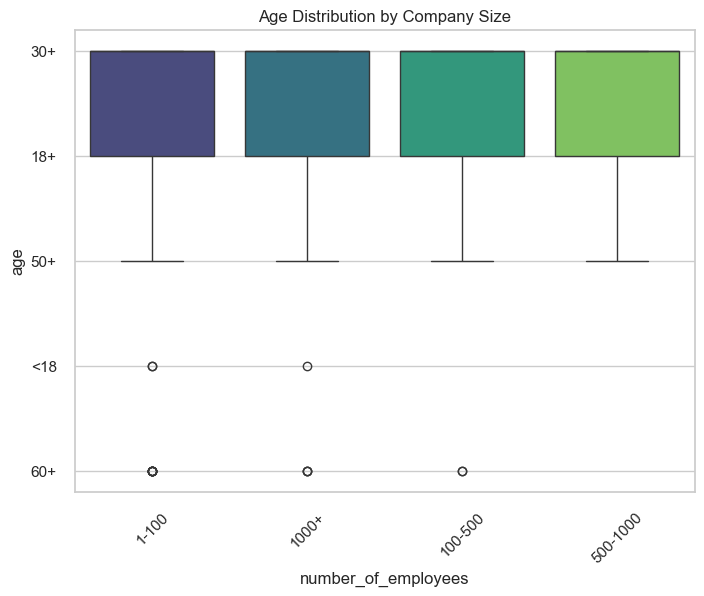

In [18]:
# 4. Box Plot for Numerical Data (e.g., Age) #!Hello
plt.figure(figsize=(8, 6))
sns.boxplot(data=data, x='number_of_employees', y='age', palette="viridis")  # Updated to new name
plt.title('Age Distribution by Company Size')
plt.xticks(rotation=45)
plt.show()

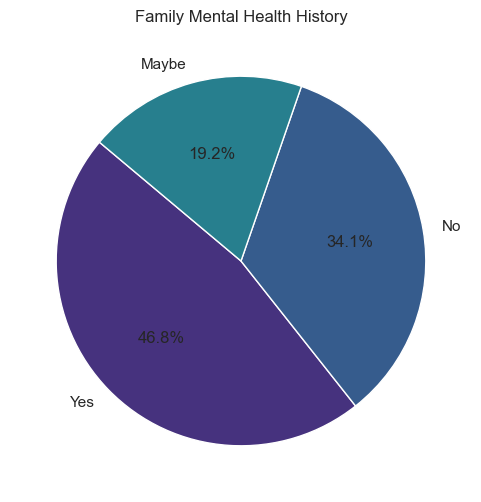

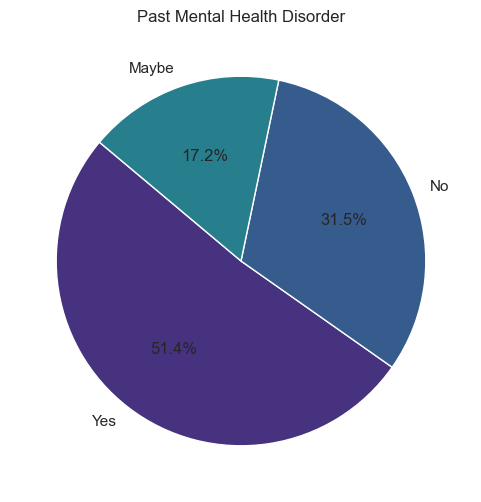

In [19]:
# 5. Pie Charts for High-Level Overviews
family_mh_counts = data['family_history_of_mental_illness'].value_counts()  # Updated to new name
plt.figure(figsize=(6, 6))
plt.pie(family_mh_counts, labels=family_mh_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette("viridis"))
plt.title('Family Mental Health History')
plt.show()

past_mh_counts = data['history_of_mental_health_disorder'].value_counts()  # Updated to new name
plt.figure(figsize=(6, 6))
plt.pie(past_mh_counts, labels=past_mh_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette("viridis"))
plt.title('Past Mental Health Disorder')
plt.show()

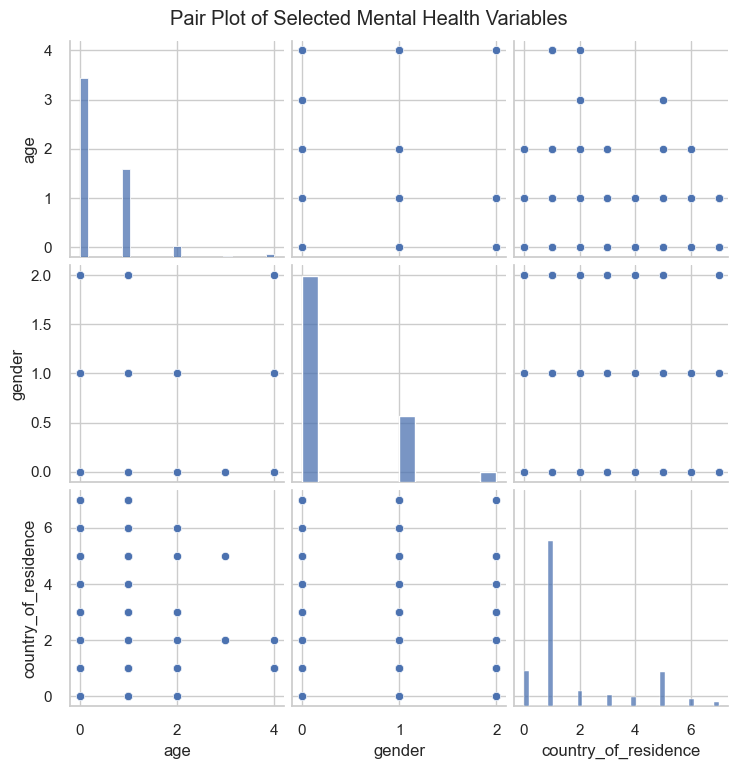

In [20]:
# 6. Pair Plot for Dimensional Relationships
selected_vars = [
    'age', 
    'gender',
    'country_of_residence'
    ]
pair_data = data[selected_vars].apply(lambda x: pd.factorize(x)[0])

sns.pairplot(pair_data, palette="coolwarm")
plt.suptitle("Pair Plot of Selected Mental Health Variables", y=1.02)
plt.show()

<Axes: >

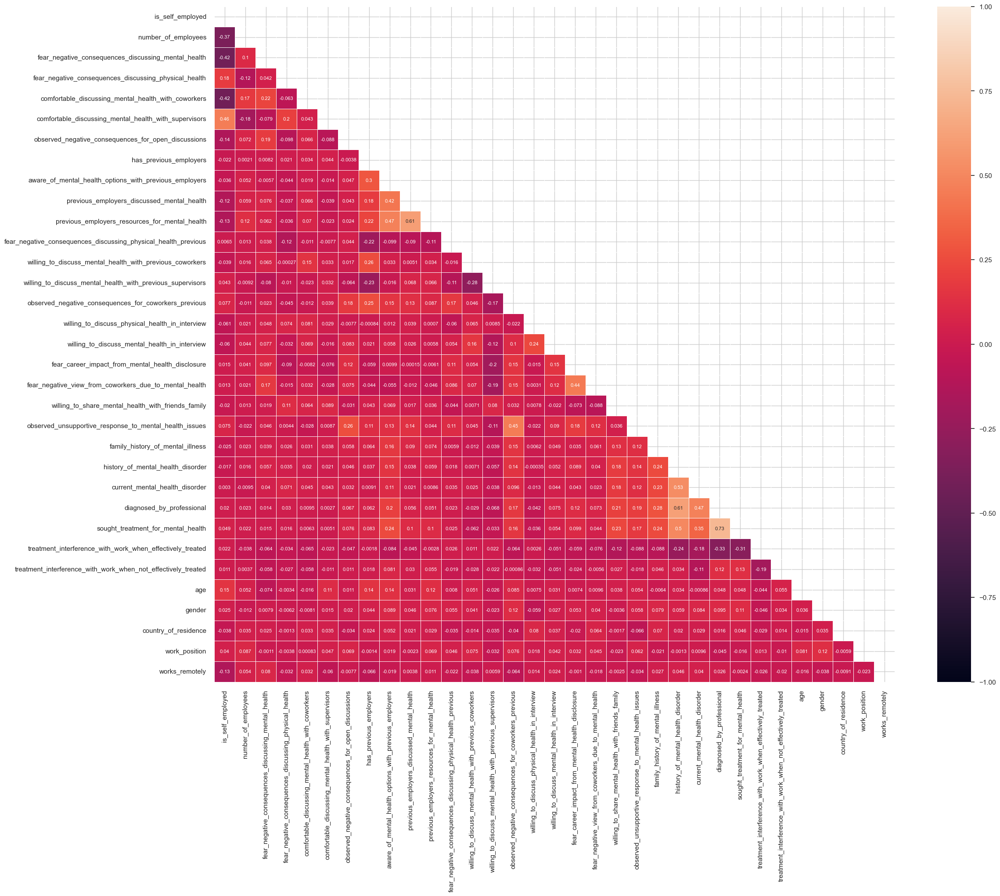

In [21]:
# I dont know heatmap
label = LabelEncoder()

for column in data.columns:
    if data[column].dtype == 'object':
        data[column] = label.fit_transform(data[column].astype(str))
        
data.head()

plt.figure(figsize=(25, 20))
mask = np.triu(np.ones_like(data.corr(), dtype=bool))

sns.heatmap(data.corr(), vmin=-1, vmax=1, mask=mask, annot=True, annot_kws={'size': 8}, linewidths=0.7)

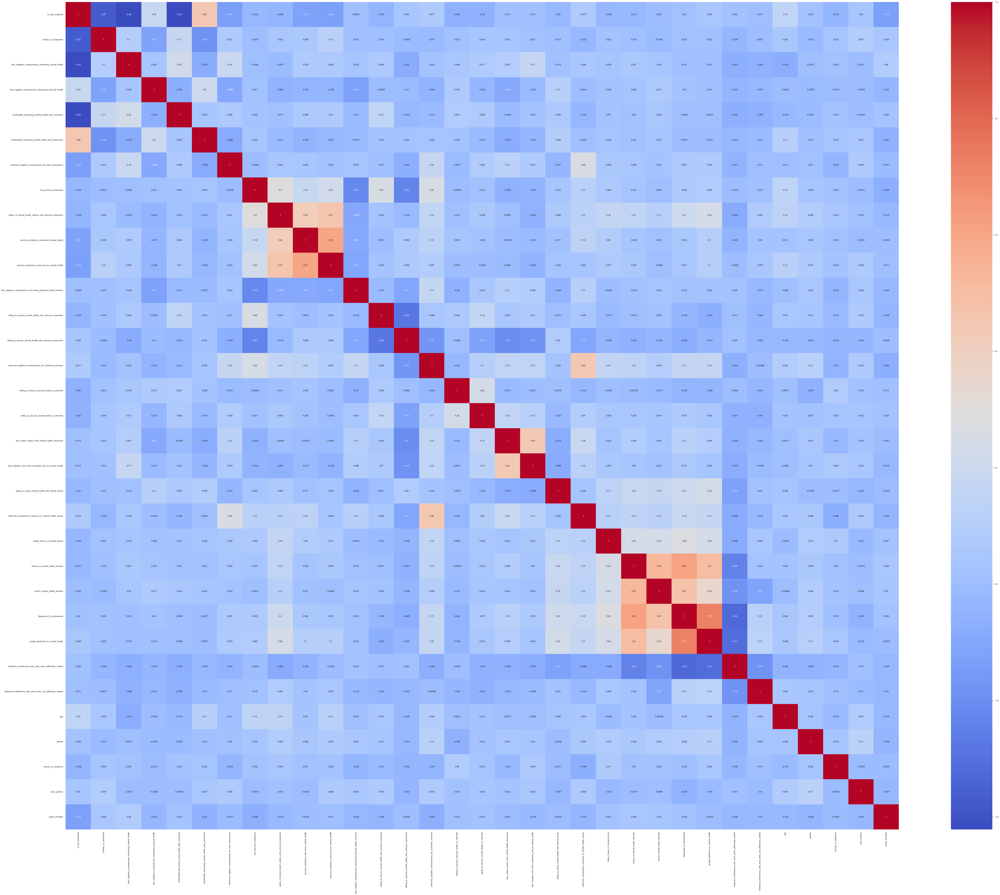

In [ ]:
# visalization of the correlation matrix
scaler = StandardScaler()
X_std = scaler.fit_transform(data)

X_std_scaled = pd.DataFrame(X_std, columns=data.columns)
corr_matrix = X_std_scaled.corr()

plt.figure(figsize=(100, 80))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()

# Dimensionality reduction

In [23]:
pca = PCA(n_components=0.8)
pca.fit
X_pca = pca.fit_transform(X_std)
print('Explained variance ratio:', pca.explained_variance_ratio_)
print(X_pca.shape)
print(X.shape)

Explained variance ratio: [0.10696853 0.07171472 0.06479027 0.06051072 0.04666612 0.03832009
 0.03791351 0.03599739 0.03437298 0.03370878 0.03153447 0.02994285
 0.02914214 0.02886321 0.02687316 0.0259948  0.02546232 0.02477625
 0.02411489 0.02221395 0.02132585]
(1433, 21)
(1433, 33)


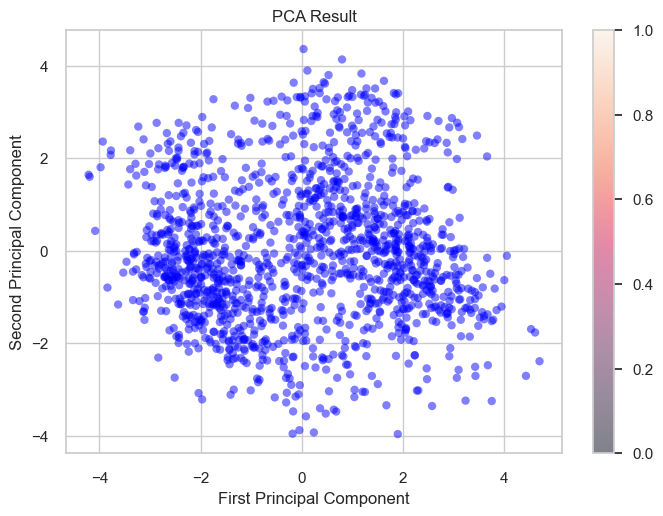

In [24]:
plt.scatter(X_pca[:, 0], X_pca[:, 1], c="blue",edgecolor='none', alpha = 0.5, cmap='viridis')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('PCA Result')
plt.colorbar()
plt.show()

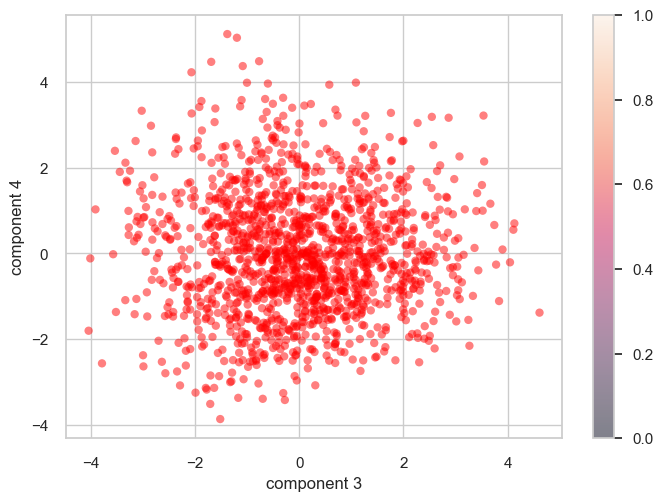

In [25]:
plt.scatter(X_pca[:, 2], X_pca[:, 3],
            c="red", edgecolor='none', alpha=0.5,
            cmap=plt.cm.get_cmap('Blues', 10))
plt.xlabel('component 3')
plt.ylabel('component 4')
plt.colorbar()

Text(0, 0.5, 'cumulative explained variance')

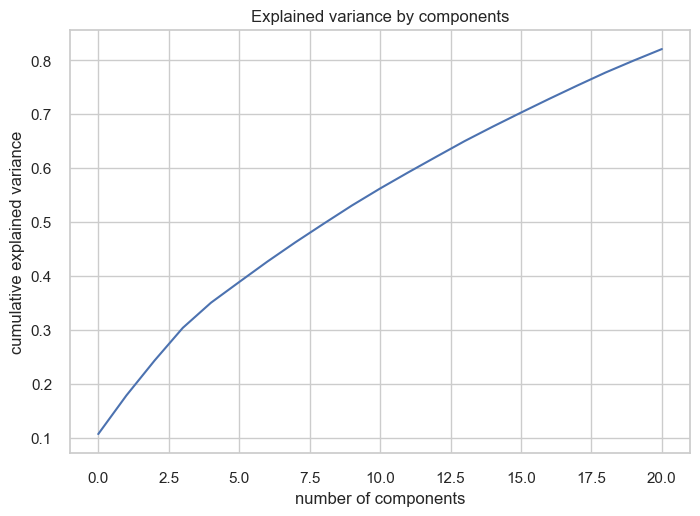

In [26]:
# visualize cumulative variance
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.title('Explained variance by components')
plt.ylabel('cumulative explained variance')

# Cluster

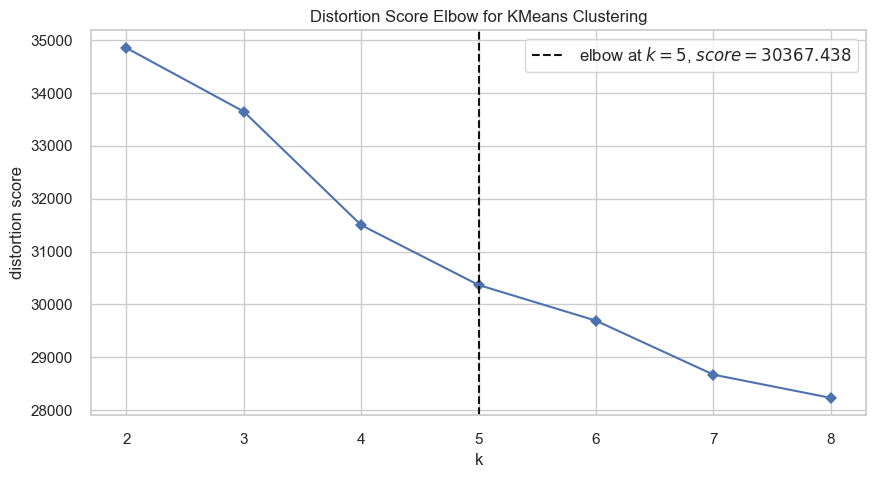

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [27]:
model = KMeans(init="k-means++", max_iter=200)
# create a k-Means model an Elbow-Visualizer
visualizer = KElbowVisualizer(model, timings=False, k=8) 
# fit the visualizer and show the plot
plt.figure(figsize=(10, 5))
visualizer.fit(X_pca)
visualizer.show()

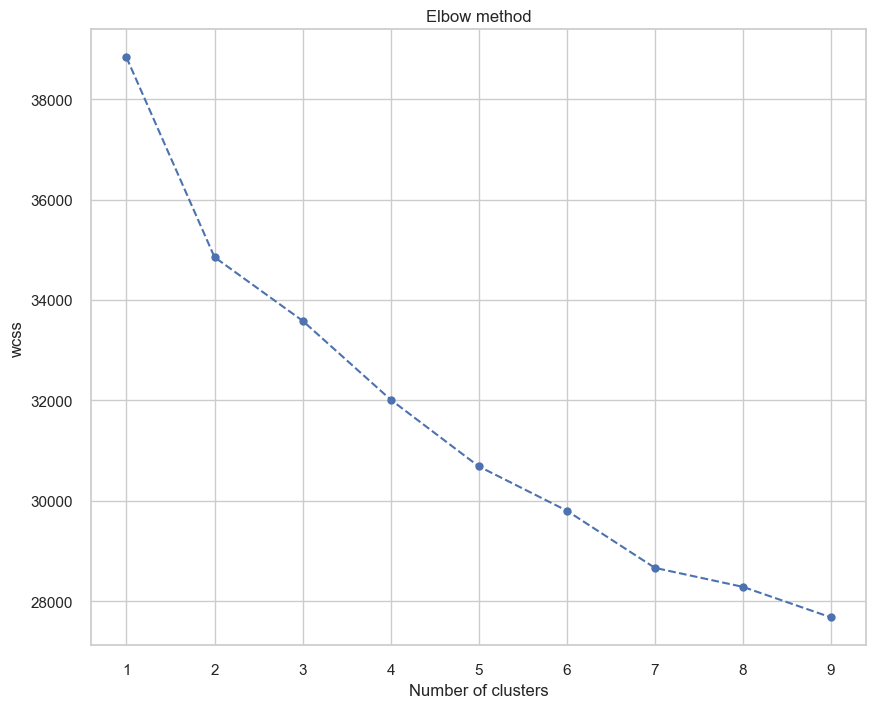

In [28]:
wcss = []
for i in range(1,10):
    kmeans_pca = KMeans(n_clusters = i,init = "k-means++", random_state=42)
    kmeans_pca.fit(X_pca)
    wcss.append(kmeans_pca.inertia_)
    
plt.figure(figsize= (10,8))
plt.plot(range(1,10),wcss, marker='o',linestyle='--')
plt.xlabel('Number of clusters')
plt.title('Elbow method')
plt.ylabel('wcss')
plt.show()

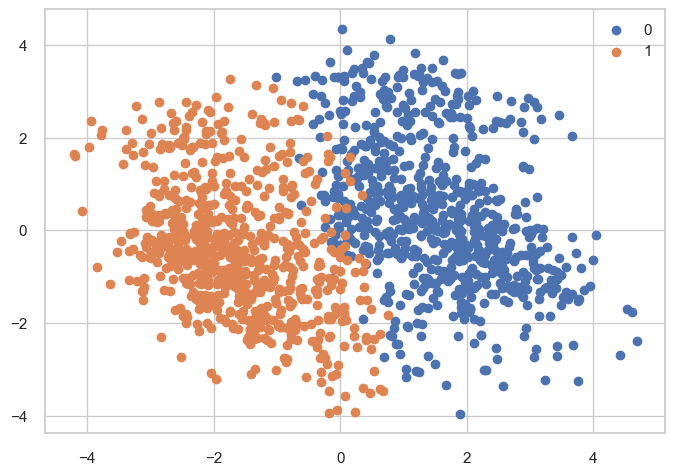

In [31]:
kmeans_pca = KMeans(n_clusters=2, init= 'k-means++',n_init ="auto" ,random_state=42)
cluster = kmeans_pca.fit_predict(X_pca)

u_labels = np.unique(cluster)
 
#plotting the results:
for i in u_labels:
    plt.scatter(X_pca[cluster == i , 0] , X_pca[cluster == i , 1] , label = i)
plt.legend()
plt.show()

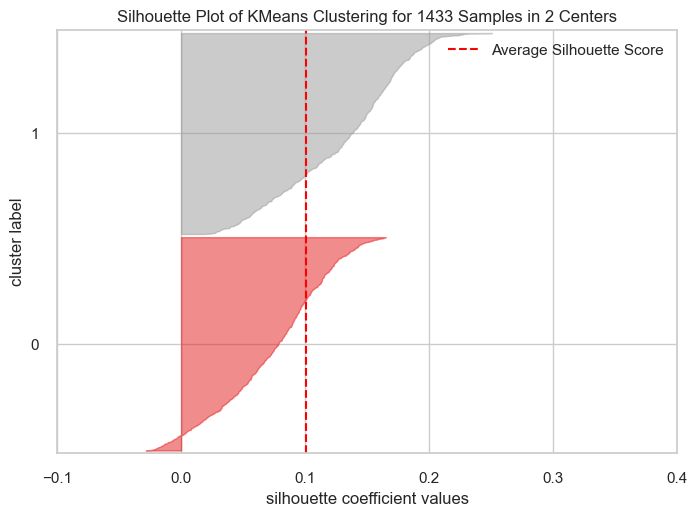

Inertia: 34853.95090922713
Silhouette Avg: 0.1
Calinski Harabasz Score: 163.4
Davies Bouldin Score: 2.91


,is_self_employed,number_of_employees,fear_negative_consequences_discussing_mental_health,fear_negative_consequences_discussing_physical_health,comfortable_discussing_mental_health_with_coworkers,comfortable_discussing_mental_health_with_supervisors,observed_negative_consequences_for_open_discussions,has_previous_employers,aware_of_mental_health_options_with_previous_employers,previous_employers_discussed_mental_health,...,12,13,14,15,16,17,component 1,component 2,component 3,kmeans pca
0,0,0,1,1,0,2,0,1,0,0,...,0.987983,-0.755498,-0.428248,0.235670,0.412112,0.228854,0.504756,0.807229,-0.155587,1
1,0,0,1,1,0,2,0,1,1,0,...,-0.463701,0.468264,-0.093138,0.108316,-1.428741,0.673544,1.003270,-0.515564,-0.288230,0
2,0,0,0,1,0,0,0,1,0,0,...,-1.433173,-0.072065,1.441848,-0.106262,1.516723,0.037714,0.634633,0.140959,-0.883770,1
3,1,0,0,1,0,2,0,1,0,0,...,0.969563,0.304160,-0.665814,-1.204316,-0.390240,0.497238,-1.440071,2.012187,1.513075,0
4,0,0,2,0,0,1,0,1,0,1,...,0.934228,1.715085,-0.058561,1.019757,0.417737,0.042228,1.448220,0.900917,-0.257377,0


In [32]:
sil_visualizer = SilhouetteVisualizer(kmeans_pca)
sil_visualizer.fit(X_pca)    
sil_visualizer.show()

inertia_score = kmeans_pca.inertia_
print("Inertia:", inertia_score)

# Silhouette Score
silhouette_avg = silhouette_score(X_pca, cluster)
print("Silhouette Avg:", round(silhouette_avg, 3))

# Calinski Harabasz Score
cal_score = calinski_harabasz_score(X_pca, cluster)
print("Calinski Harabasz Score:", round(cal_score, 1))

# Davies Bouldin Score
d_score = davies_bouldin_score(X_pca, cluster)
print("Davies Bouldin Score:", round(d_score, 2))

df_pca_kmeans = pd.concat([data.reset_index(drop=True),pd.DataFrame(X_pca)], axis=1)
df_pca_kmeans.columns.values[-3: ] = ['component 1','component 2','component 3']
df_pca_kmeans['kmeans pca'] = kmeans_pca.labels_

df_pca_kmeans.head()

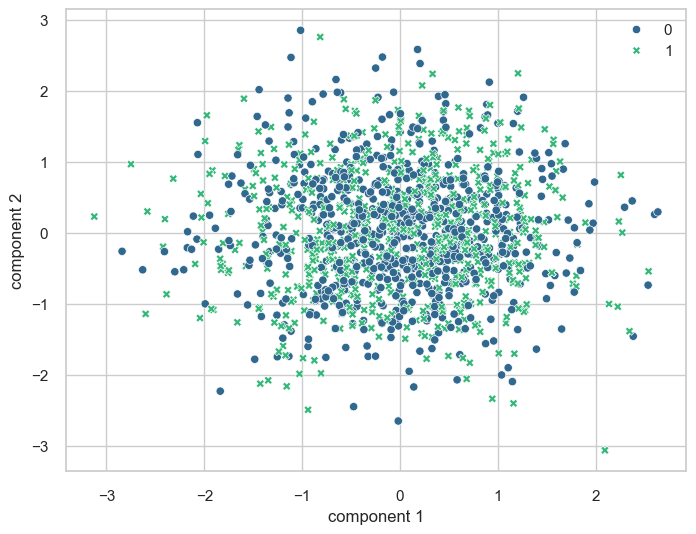

In [33]:
# visualization of component 1 and component 2
x_axis = df_pca_kmeans['component 1']
y_axis = df_pca_kmeans['component 2']

plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_pca_kmeans, x='component 1', y='component 2',
                hue=cluster, palette='viridis', style=cluster, legend='full')
plt.show()

<Axes: xlabel='component 1', ylabel='component 3'>

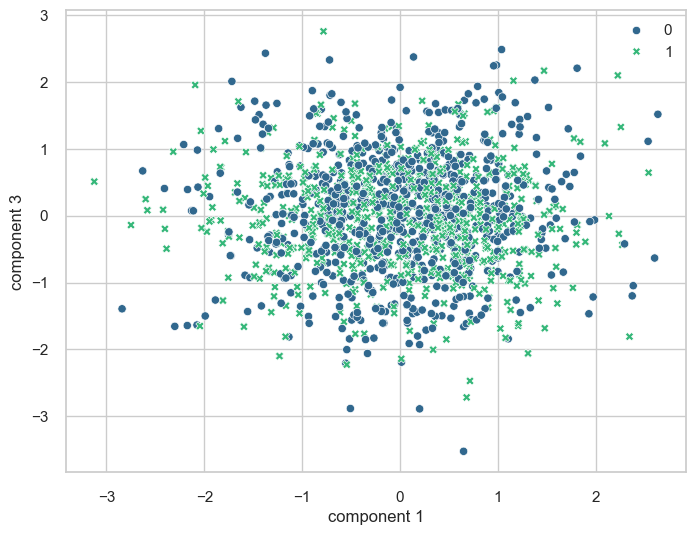

In [34]:
# visualization of component 1 and component 3
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_pca_kmeans, x='component 1', y='component 3',
                hue=cluster, palette='viridis', style=cluster, legend='full')

In [35]:
len(cluster)

1433

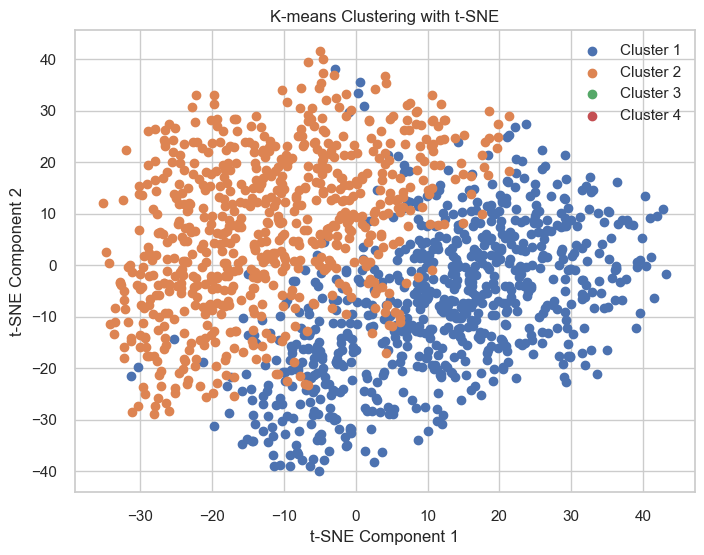

In [36]:
# visualization through TSNE.
tsne = TSNE(n_components=3, random_state=0)
projections = tsne.fit_transform(X_pca)

plt.figure(figsize=(8, 6))
for i in range(4):
    plt.scatter(projections[cluster == i][:, 0], projections[cluster == i][:, 1], label=f'Cluster {i + 1}')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('K-means Clustering with t-SNE')
plt.legend()
plt.show()

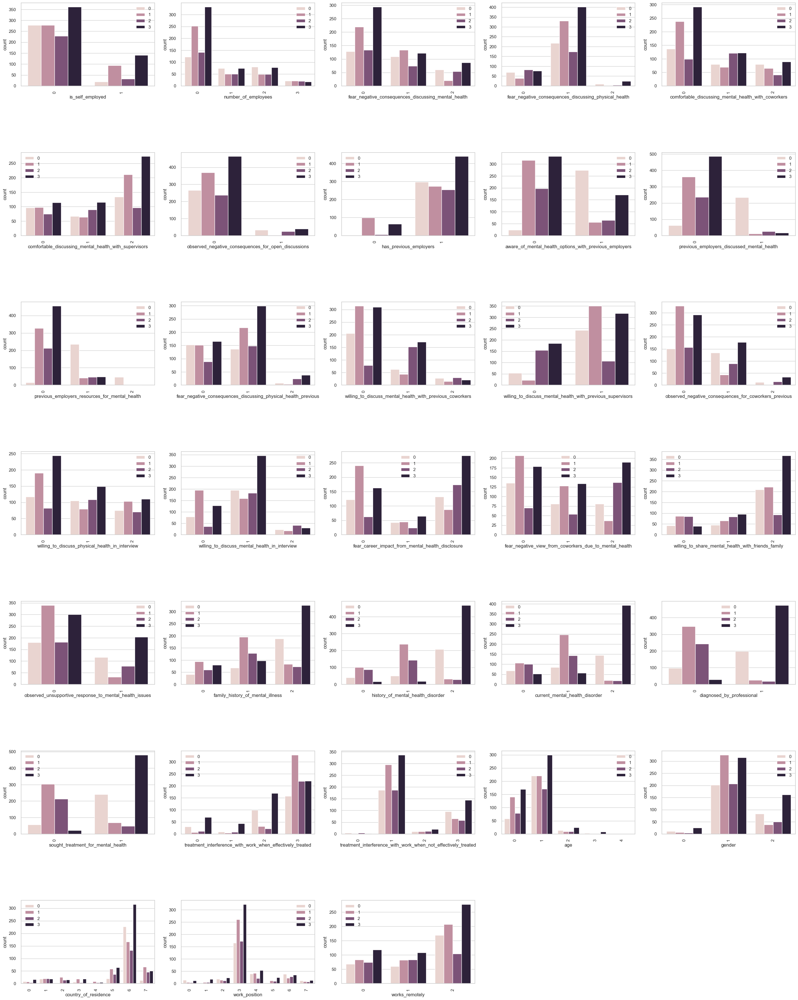

In [75]:
# visulization through multi-plot countplot 
c =  X.columns

plt.figure(figsize=(35, 65))
for i, column in enumerate(data.columns):
    if column != cluster[i]:
        plt.subplot(10, 5, i+1)
        sns.countplot(data=data, x=column, hue=cluster)
        plt.xticks(rotation=90)
        plt.subplots_adjust(wspace=0.2, hspace=0.8)

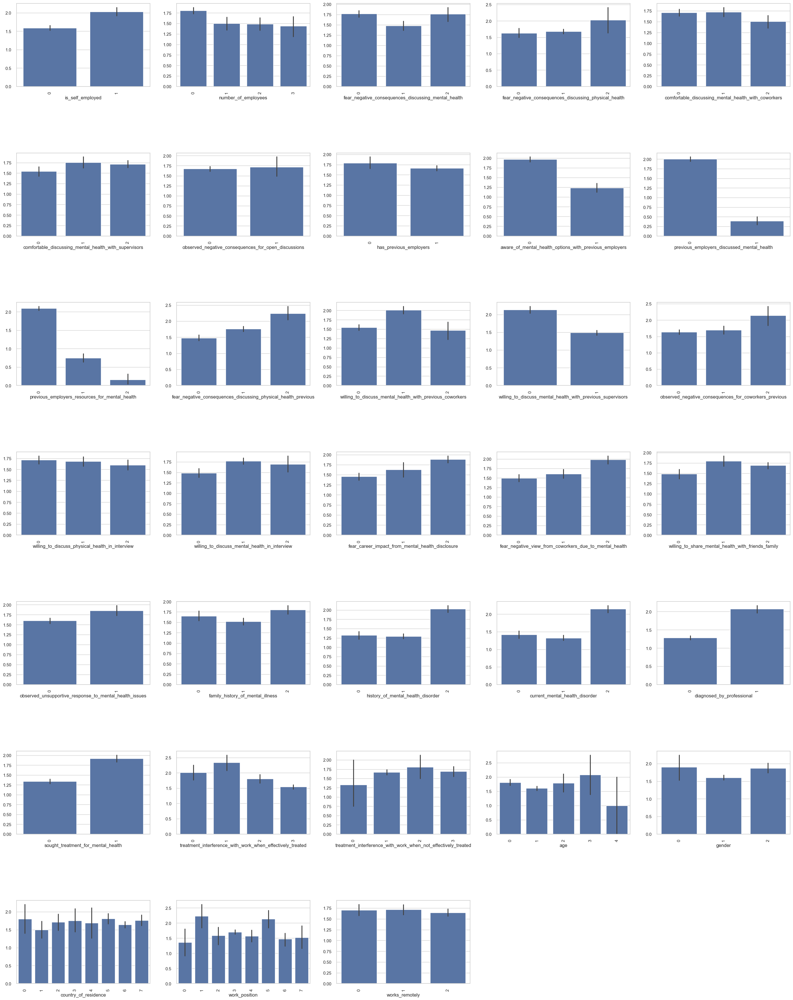

In [74]:
# visualization through barplot 
c =  X.columns

plt.figure(figsize=(35, 65))
for i, column in enumerate(c):
    if column != cluster[i]:
        plt.subplot(10, 5, i+1)
        sns.barplot(data=X, x=column, y=cluster)
        plt.xticks(rotation=90)
        plt.subplots_adjust(wspace=0.2, hspace=0.8)